### Select immune cells from non-enriched gonadal samples

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os

import sys

def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './final-figures/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.7.6
scanpy      1.8.0
sinfo       0.3.4
-----
PIL                 8.3.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cffi                1.14.5
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
debugpy             1.3.0
decorator           4.4.2
h5py                3.3.0
igraph              0.9.5
ipykernel           6.0.1
ipython_genutils    0.2.0
jedi                0.18.0
joblib              1.0.1
kiwisolver          1.3.1
leidenalg    

'/home/jovyan/my-conda-envs/atac_env/bin/python'

In [2]:
seed = 123

In [3]:
adata = sc.read('/nfs/team292/lg18/with_valentina/gonadsV2_revision/FCA-gonads_rawcounts.h5ad')
adata

AnnData object with n_obs × n_vars = 396565 × 28820
    obs: 'n_genes', 'sample', 'donor', 'location', 'stage', 'sex', 'study', 'batch_collection', 'enrichment', 'cryopreserved', 'TP', '10xKit', 'dig_protocol', 'percent_mito', 'n_counts', 'batch', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'lineages_v1', 'celltype_v1', 'lineage_v2', 'somatic_celltype_v2', 'PCW', 'sample_source', 'trimester'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'n_cells-15', 'gene_ids-16', 'feature_types-16', 'n_cells-16', 'gene_ids-17', 'feature_typ

In [5]:
metadata_females = pd.read_csv('/nfs/team292/lg18/with_valentina/gonadsV2_revision/FCA-gonads_female_annotated.csv',
                      index_col = 0)
metadata_females.head()

/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (29,30,32) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,n_genes,sample,donor,location,stage,sex,study,batch_collection,enrichment,cryopreserved,...,lineages_v1,celltype_v1,lineage_v2,somatic_celltype_v2,PCW,sample_source,trimester,leiden,leiden_R,lineage
FCA_GND8047885_AAACCTGAGCACACAG,2554,FCA_GND8047885,F81,Gonad_and_extragonadal,8.8,female,FCA,A,CD45-,No,...,Supporting_female,preGC_II,Supporting,preGC_IIa,8.8,N,1st,1,1,preGranulosa
FCA_GND8047885_AAACCTGAGCACGCCT,2032,FCA_GND8047885,F81,Gonad_and_extragonadal,8.8,female,FCA,A,CD45-,No,...,Supporting_female,preGC_II_hypoxia,Supporting,preGC_IIa,8.8,N,1st,1,1,preGranulosa
FCA_GND8047885_AAACCTGAGCAGCCTC,2664,FCA_GND8047885,F81,Gonad_and_extragonadal,8.8,female,FCA,A,CD45-,No,...,Mesenchymal_LHX9_ARX,M_cycling,Mesenchymal_LHX9,Gi,8.8,N,1st,3,3,Mesenchymal_LHX9
FCA_GND8047885_AAACCTGAGCCACGCT,2256,FCA_GND8047885,F81,Gonad_and_extragonadal,8.8,female,FCA,A,CD45-,No,...,Supporting_female,sLGR5,Supporting,preGC_IIa,8.8,N,1st,7,7,Supporting
FCA_GND8047885_AAACCTGAGCTTTGGT,2064,FCA_GND8047885,F81,Gonad_and_extragonadal,8.8,female,FCA,A,CD45-,No,...,lowQC,lowQC,Mesenchymal_LHX9,Oi,8.8,N,1st,3,3,Mesenchymal_LHX9


In [6]:
metadata_males = pd.read_csv('/nfs/team292/lg18/with_valentina/gonadsV2_revision/FCA-gonads_male_annotated.csv',
                      index_col = 0)
metadata_males.head()

/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (29,30) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,n_genes,sample,donor,location,stage,sex,study,batch_collection,enrichment,cryopreserved,...,lineages_v1,celltype_v1,lineage_v2,somatic_celltype_v2,PCW,sample_source,trimester,leiden,leiden_R,lineage
FCA_GND8289580_AAACCTGAGACAGGCT,2696,FCA_GND8289580,F88,Gonad_and_extragonadal,11.0,male,FCA,D,CD45-,No,...,Mesenchymal_LHX9_ARX,Ti,Mesenchymal_LHX9,Ti,11.0,N,1st,0,0,Mesenchymal_LHX9
FCA_GND8289580_AAACCTGAGACGCACA,1591,FCA_GND8289580,F88,Gonad_and_extragonadal,11.0,male,FCA,D,CD45-,No,...,Mesenchymal_LHX9_ARX,Ti,Mesenchymal_LHX9,Ti,11.0,N,1st,0,0,Mesenchymal_LHX9
FCA_GND8289580_AAACCTGAGAGTCGGT,1383,FCA_GND8289580,F88,Gonad_and_extragonadal,11.0,male,FCA,D,CD45-,No,...,Coel Epi,coelEpi,CoelEpi,CoelEpi_LHX9,11.0,N,1st,15,15,CoelEpi
FCA_GND8289580_AAACCTGAGCCCTAAT,1365,FCA_GND8289580,F88,Gonad_and_extragonadal,11.0,male,FCA,D,CD45-,No,...,Sertoli,Sertoli,Sertoli,Sertoli,11.0,N,1st,2,2,Sertoli
FCA_GND8289580_AAACCTGAGCTTCGCG,1221,FCA_GND8289580,F88,Gonad_and_extragonadal,11.0,male,FCA,D,CD45-,No,...,Sertoli,Sertoli,Sertoli,Sertoli,11.0,N,1st,2,2,Sertoli


In [7]:
metadata = metadata_females.append(metadata_males)
metadata['lineage'].value_counts(dropna = False)

Mesenchymal_GATA2    84229
Mesenchymal_LHX9     66077
preGranulosa         38881
Sertoli              34969
lowQC                34516
Supporting           28124
CoelEpi              24458
Epithelial           20222
GermCells            14516
Endothelial          14484
PV                   12679
Doublet               5821
Immune                5533
Neural                3783
SMCs                  3044
FetalLeydig           2426
cont                  1432
Erythroid             1371
Name: lineage, dtype: int64

In [8]:
metadata_map = metadata['lineage'].to_dict()

In [9]:
adata.obs['lineage'] = adata.obs.index.map(metadata_map)

In [12]:
adata.obs['lineage'].value_counts(dropna = False)

Mesenchymal_GATA2    84229
Mesenchymal_LHX9     66077
preGranulosa         38881
Sertoli              34969
lowQC                34516
Supporting           28124
CoelEpi              24458
Epithelial           20222
GermCells            14516
Endothelial          14484
PV                   12679
Doublet               5821
Immune                5533
Neural                3783
SMCs                  3044
FetalLeydig           2426
cont                  1432
Erythroid             1371
Name: lineage, dtype: int64

In [13]:
adata.obs['sex'].value_counts()

female    243972
male      152593
Name: sex, dtype: int64

In [14]:
adata.obs['stage'].value_counts()

17.0    48133
21.0    38985
15.0    35476
14.0    34172
12.0    30164
16.0    28145
8.6     27569
11.0    25041
6.5     21124
13.0    20126
10.0    18513
8.8     17731
8.0     12377
7.0     11578
9.0      7547
19.0     7294
7.5      4071
6.0      3622
18.0     3095
8.4      1802
Name: stage, dtype: int64

In [15]:
adata.raw = adata.copy()

#### Basic quality control has already been performed 

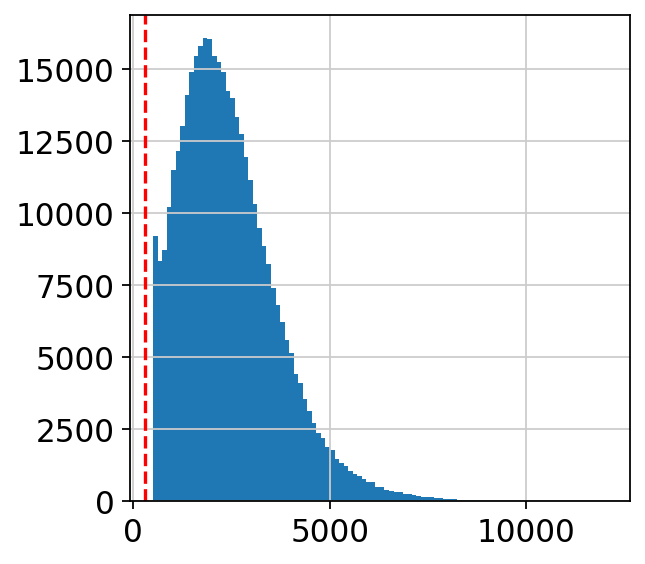

In [16]:
# Filter out cells with few genes 
import matplotlib.pyplot as plt
plt.hist(adata.obs['n_genes'], bins = 100)
plt.axvline(300, linestyle = '--', color = 'red')

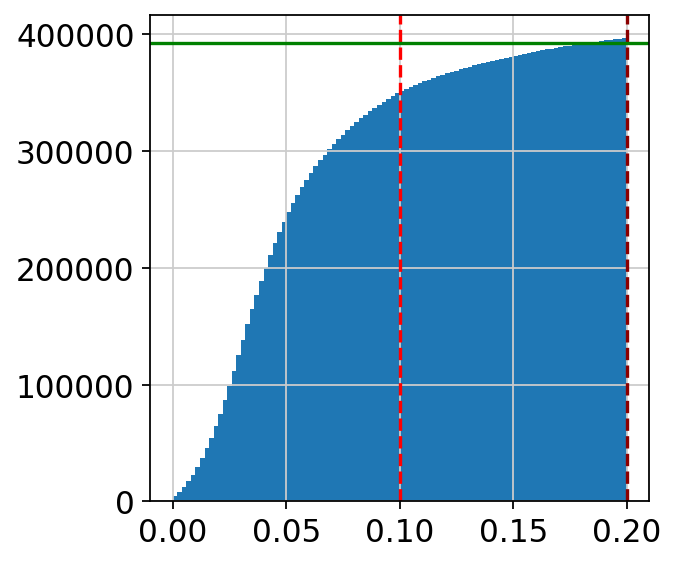

In [17]:
# Filter out cells with a high percentage of mitochondrial genes 
plt.hist(adata.obs['percent_mito'], bins = 100, cumulative=True)
plt.axvline(0.1, linestyle = '--', color = 'red')
plt.axvline(0.2, linestyle = '--', color = 'darkred')
plt.axhline(adata.n_obs*0.99, linestyle = '-', color = 'green')

In [18]:
print('Total number of cells: {:d}'.format(adata.n_obs))
print('Total number of genes: {:d}'.format(adata.n_vars))

Total number of cells: 396565
Total number of genes: 28820


#### Visualize data

In [19]:
adata.obs['lineage'].value_counts()

Mesenchymal_GATA2    84229
Mesenchymal_LHX9     66077
preGranulosa         38881
Sertoli              34969
lowQC                34516
Supporting           28124
CoelEpi              24458
Epithelial           20222
GermCells            14516
Endothelial          14484
PV                   12679
Doublet               5821
Immune                5533
Neural                3783
SMCs                  3044
FetalLeydig           2426
cont                  1432
Erythroid             1371
Name: lineage, dtype: int64

#### Select immune cells only and process the subset

In [21]:
adata = adata[[i in ['Immune'] for i in adata.obs['lineage']]]

In [22]:
#Reset data to raw
adata = anndata.AnnData(X = adata.raw.X, var = adata.raw.var, obs = adata.obs)
adata

AnnData object with n_obs × n_vars = 5533 × 28820
    obs: 'n_genes', 'sample', 'donor', 'location', 'stage', 'sex', 'study', 'batch_collection', 'enrichment', 'cryopreserved', 'TP', '10xKit', 'dig_protocol', 'percent_mito', 'n_counts', 'batch', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'lineages_v1', 'celltype_v1', 'lineage_v2', 'somatic_celltype_v2', 'PCW', 'sample_source', 'trimester', 'lineage'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'n_cells-15', 'gene_ids-16', 'feature_types-16', 'n_cells-16', 'gene_ids-17', 'fe

In [23]:
# Saving copy of the data
adata.raw = adata

In [24]:
# Filter out genes that are poorly expressed 
sc.pp.filter_genes(adata, min_cells=3)

filtered out 8333 genes that are detected in less than 3 cells


#### Normalize and log-transform

In [25]:
# Normalize per cell
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# Log-transform the data 
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


#### Filter HVGs on bdata and compute Principal Component Analsysi on them 

In [26]:
bdata = adata.copy()
sc.pp.highly_variable_genes(bdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
for col in ['highly_variable','means', 'dispersions', 'dispersions_norm']:
    adata.var[col] = bdata.var[col]
bdata = bdata[:, bdata.var['highly_variable']]
print('Total number of cells: {:d}'.format(bdata.n_obs))
print('Total number of genes: {:d}'.format(bdata.n_vars))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Total number of cells: 5533
Total number of genes: 2523


/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider using pd.concat instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.var['dispersions'] = df['dispersions'].values
/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:540: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider using pd.concat instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.var['dispersions_norm'] = df['dispersions_norm'].values.astype(
/tmp/ipykernel_2794/2928043230.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, whi

In [27]:
sc.pp.scale(bdata, max_value=10)
sc.tl.pca(bdata, svd_solver='arpack', n_comps=50)

/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:845: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider using pd.concat instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  X, adata.var["mean"], adata.var["std"] = scale(


    finished (0:00:02)


#### Transfer PCA to the main data

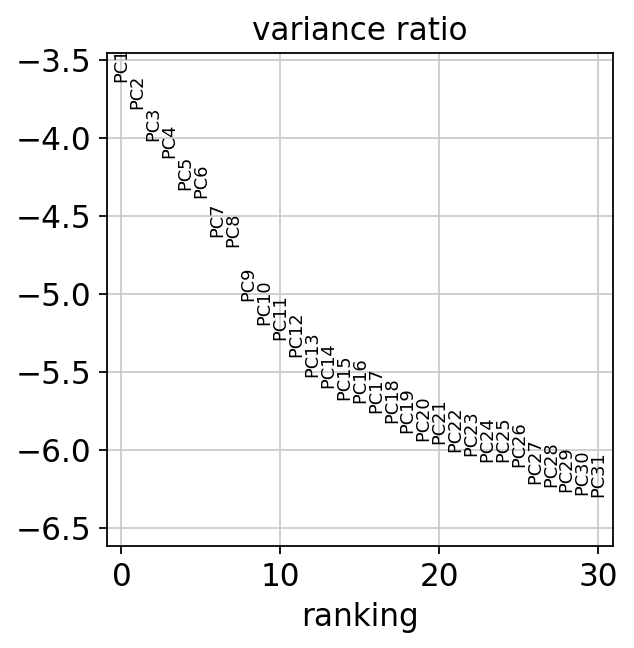

In [28]:
#fill NaNs with False so that subsetting to HVGs is possible
adata.var['highly_variable'].fillna(value=False, inplace=True)
adata.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
adata.uns['pca'] = bdata.uns['pca'].copy()
adata.varm['PCs'] = np.zeros(shape=(adata.n_vars, 50))
adata.varm['PCs'][adata.var['highly_variable']] = bdata.varm['PCs']
sc.pl.pca_variance_ratio(adata, log=True, save='.pdf')

In [29]:
# Scale
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:845: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider using pd.concat instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  X, adata.var["mean"], adata.var["std"] = scale(


#### Regress out cell cycle genes

In [30]:
# Regress out cell cycle genes
cell_cycle_genes = [x.strip() for x in open(file='/nfs/users/nfs_v/vl6/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes, random_state = seed)
sc.pp.regress_out(adata, ['S_score', 'G2M_score'])

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    586 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    543 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)
regressing out ['S_score', 'G2M_score']


/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'phase' as categorical
/home/jovyan/my-conda-envs/atac_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'lineage' as categorical


    finished (0:23:58)


#### Batch correction using Harmony 

In [31]:
# Extract PCA matrix and batch array
n_pcs = 26
pca = adata.obsm['X_pca'][:, 0:(n_pcs)]
batch = adata.obs['donor']

In [32]:
# Batch-correct the PCA using HARMONY method
%load_ext rpy2.ipython

In [33]:
%%R -i pca -i batch -o hem

library(harmony)
library(magrittr)
set.seed(1000)
hem <- HarmonyMatrix(pca, batch, theta=0, do_pca=FALSE, verbose = FALSE)
hem = data.frame(hem)

R[write to console]: Loading required package: Rcpp



In [34]:
# Add harmony values to the anndata object
adata.obsm['X_pca'] = hem.values

In [35]:
# Visualize
sc.pp.neighbors(adata, n_pcs = n_pcs, random_state= seed)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 26
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


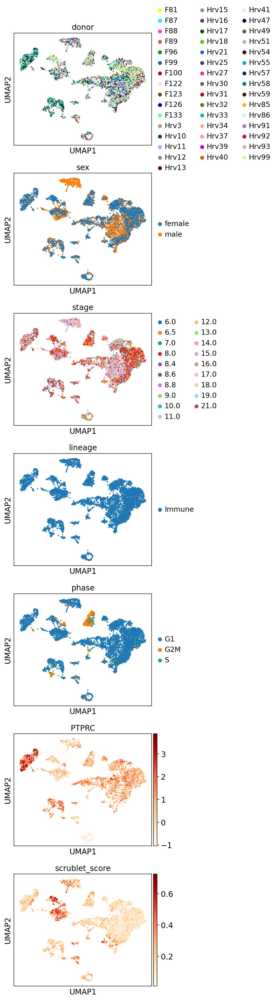

In [38]:
sc.pl.umap(adata, color=['donor','sex', 'stage', 'lineage', 'phase', 'PTPRC', 'scrublet_score'], 
           save='.pdf', ncols = 1, color_map = 'OrRd', use_raw = False)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


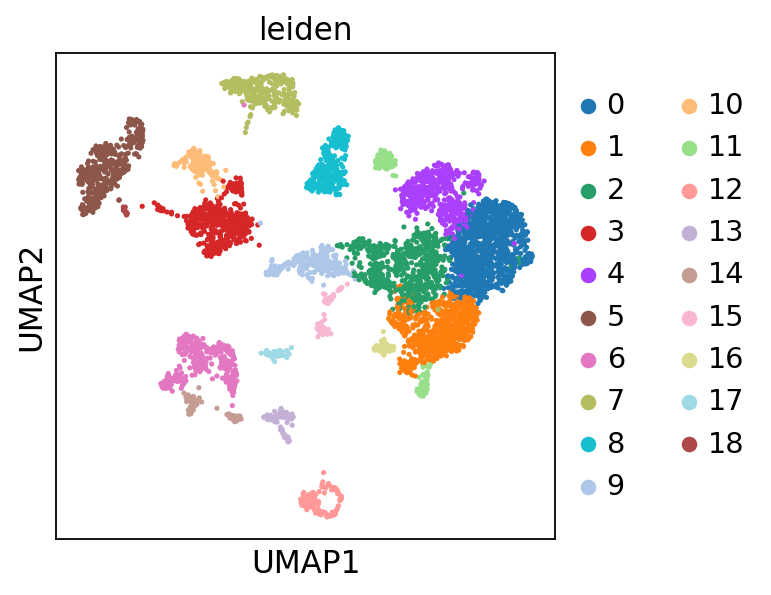

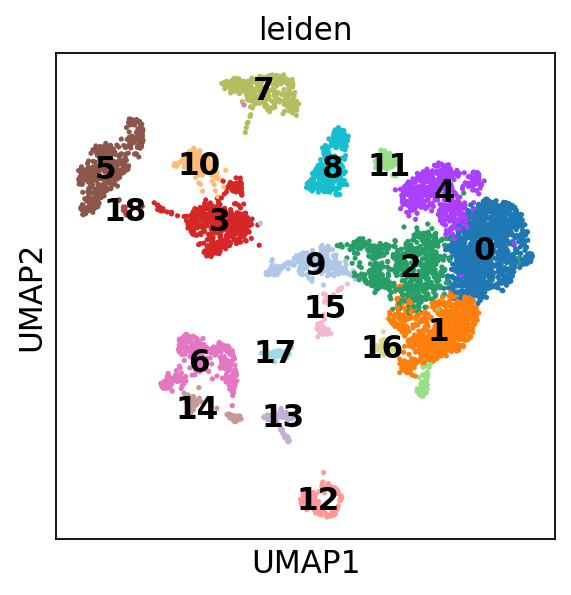

In [39]:
sc.tl.leiden(adata, resolution=0.6, random_state = seed)
sc.pl.umap(adata, color='leiden',save='_clustering.pdf')
sc.pl.umap(adata, color='leiden',legend_loc='on data',save='_clustering_clusnumbers.pdf')

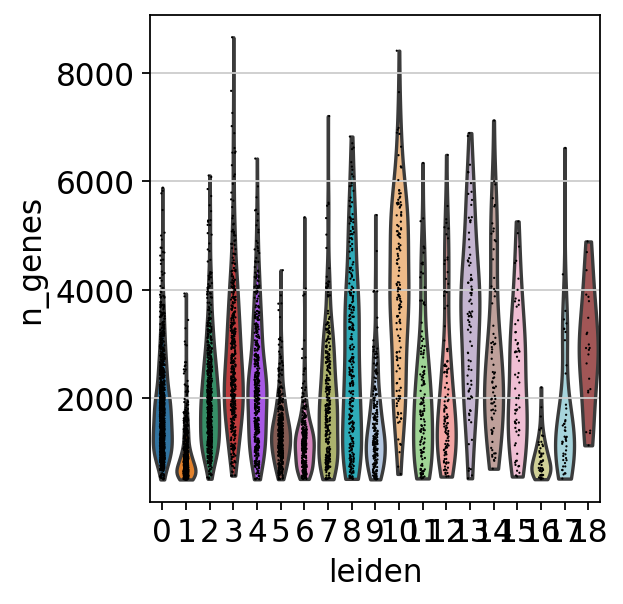

In [40]:
sc.pl.violin(adata, keys = ['n_genes'], groupby = 'leiden')

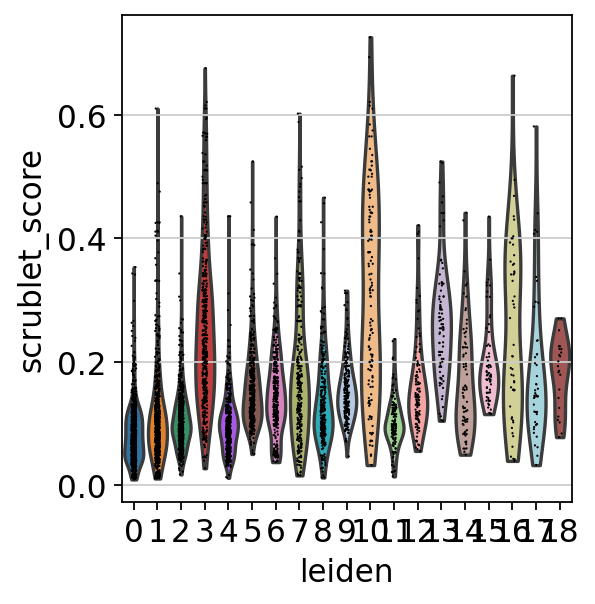

In [42]:
sc.pl.violin(adata, keys = ['scrublet_score'], groupby = 'leiden')

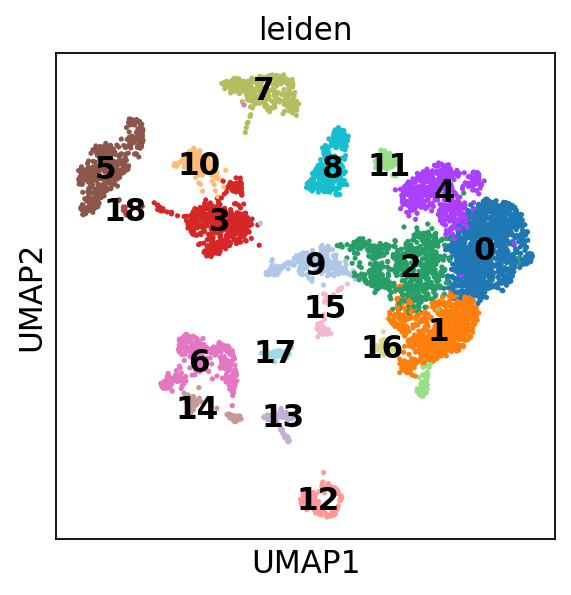

Known markers for B cells


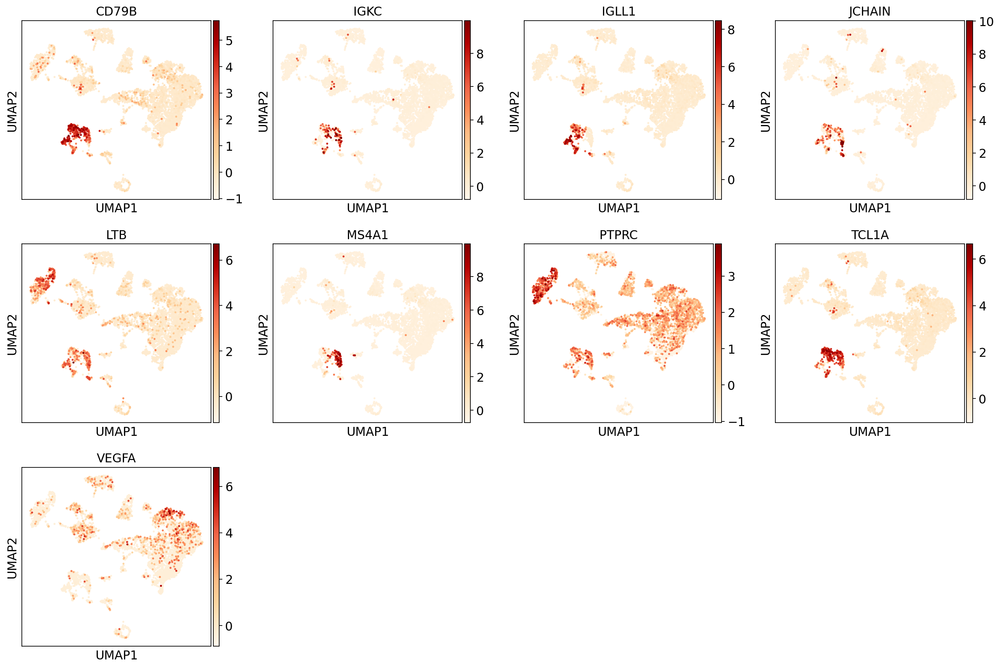

Known markers for Dendritic Cells


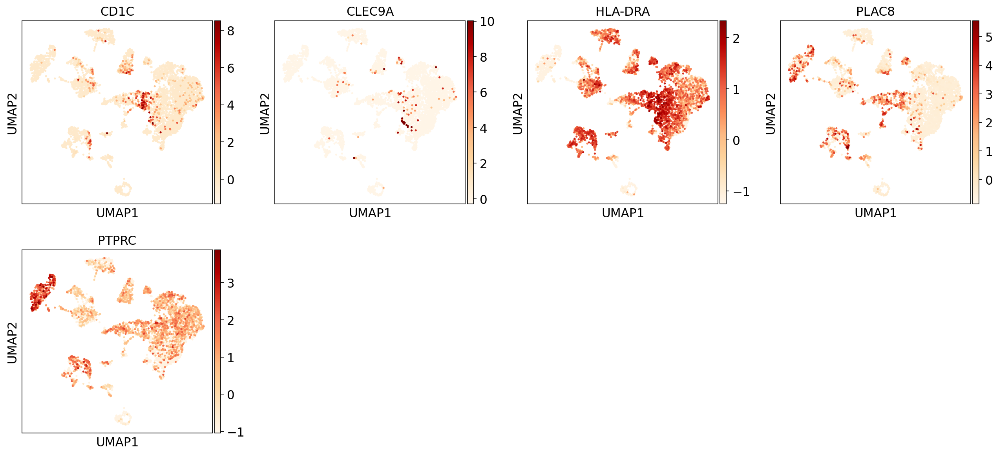

Known markers for Natural Killer cells


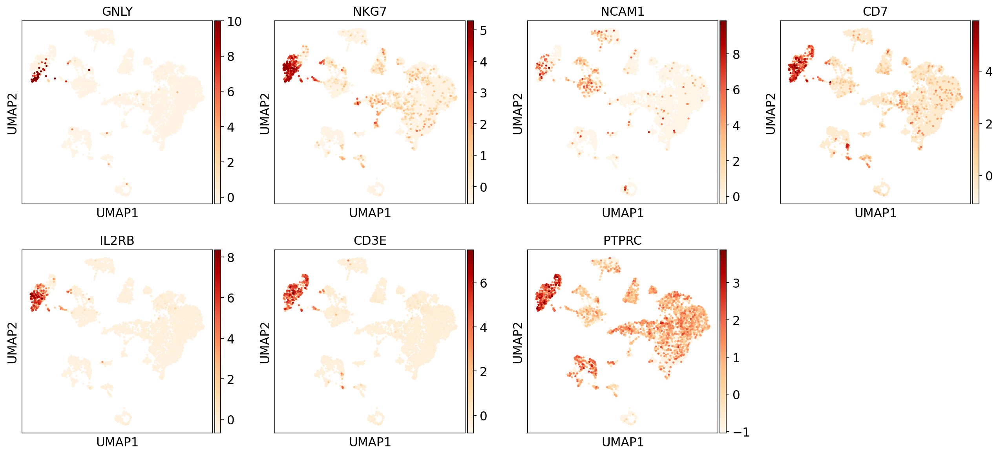

Known markers for ILC precursors


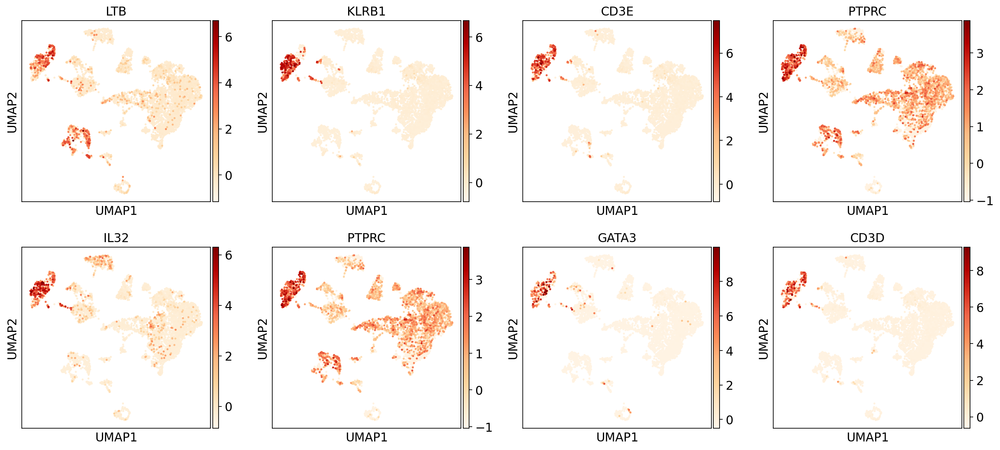

Known markers for Mast cells


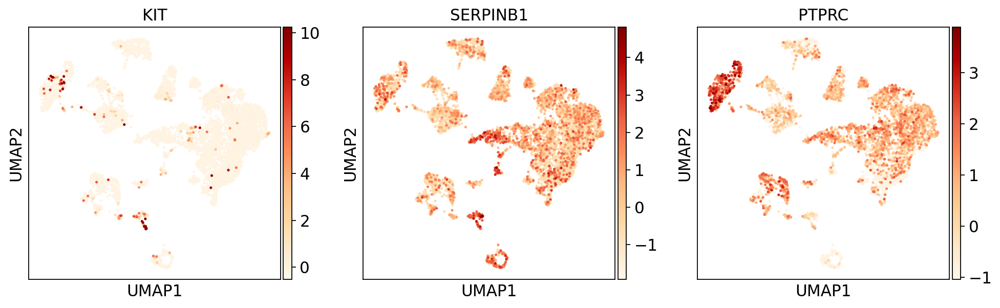

Known markers for Monocytes


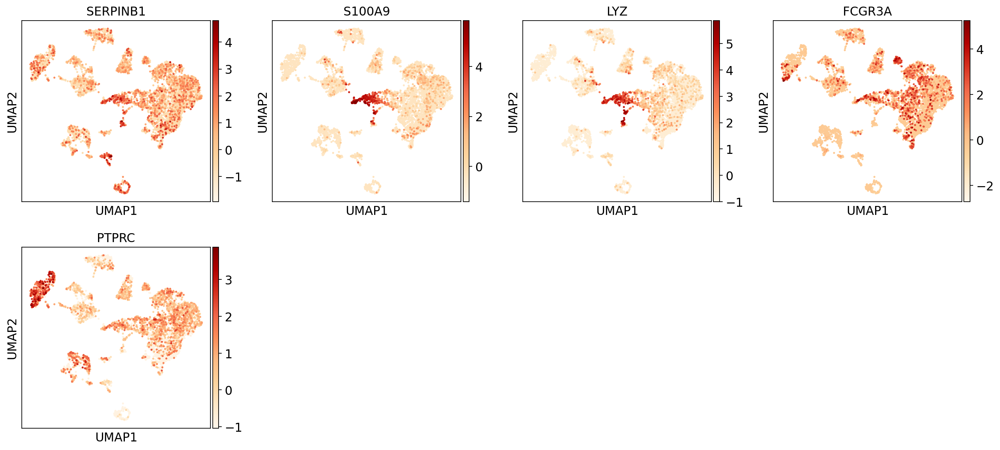

Known markers for Hematopoietic Stem Cells


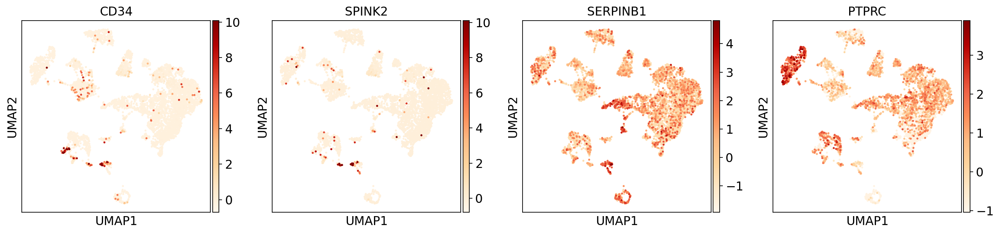

Known markers for Megakaryocytes


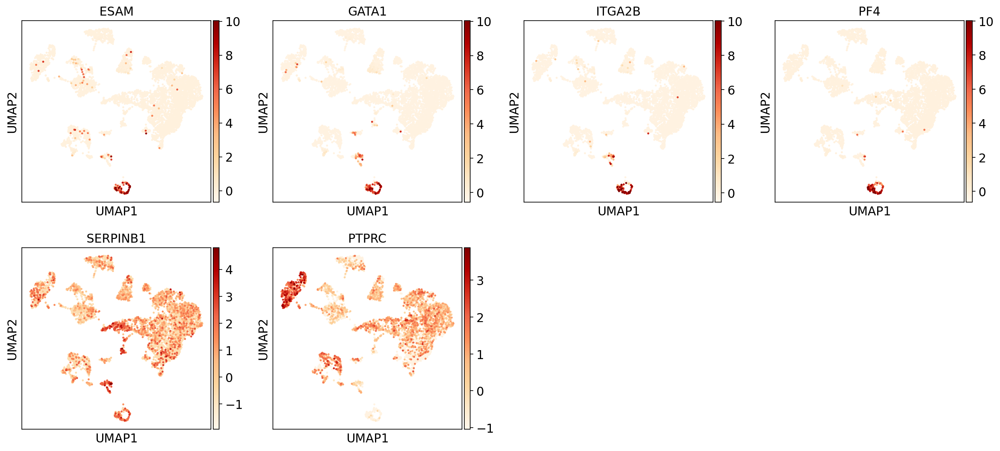

Known markers for Early Erythroid


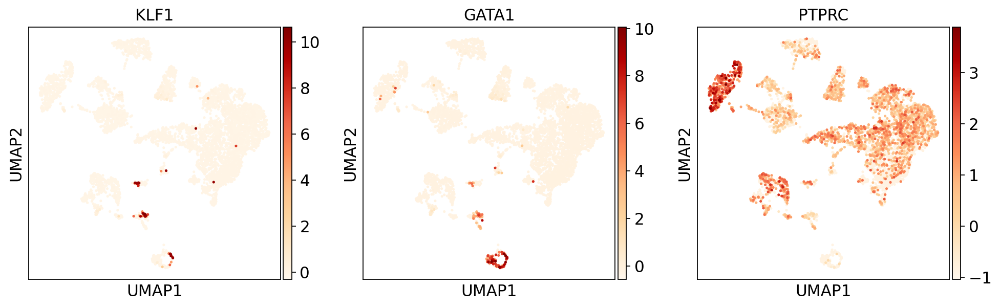

Known markers for Mid Erythroid


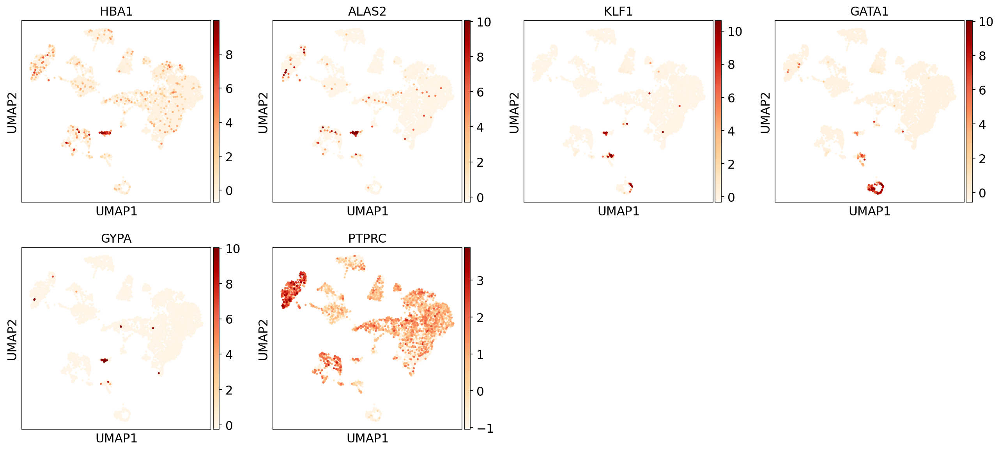

Known markers for Late Erythroid


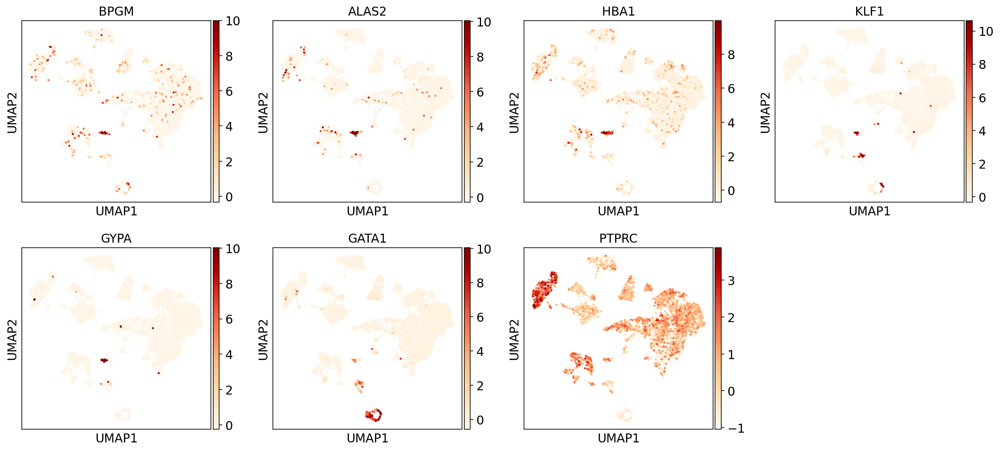

Known markers for Macrophages (broad sense)


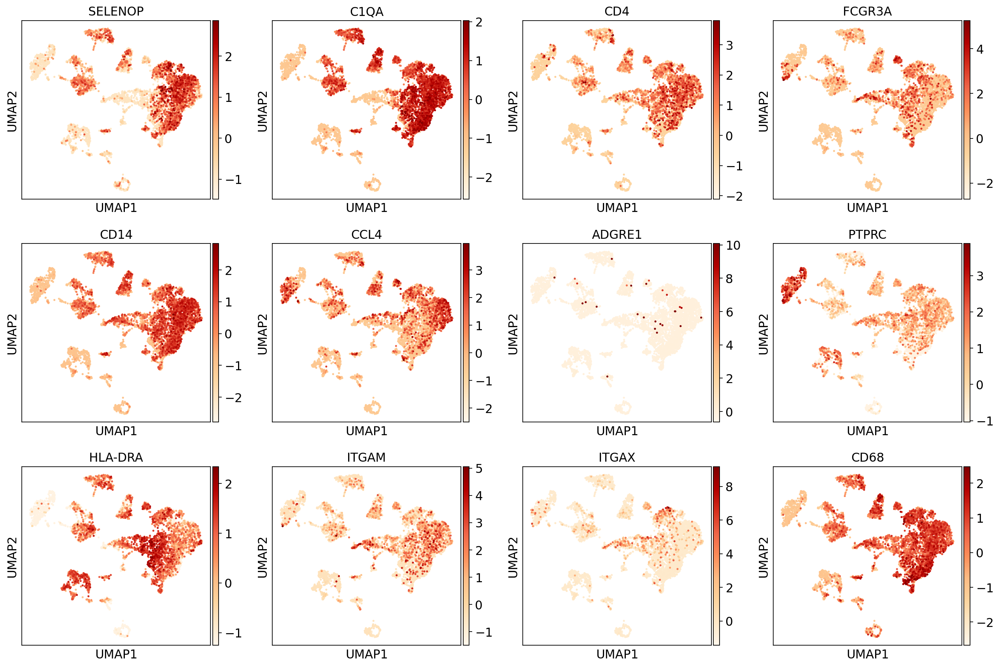

In [43]:
sc.pl.umap(adata, color='leiden',legend_loc='on data')
print('Known markers for B cells')
B_cells = np.unique(['VEGFA', 'CD79B', 'MS4A1', 'TCL1A', 'IGKC', 'JCHAIN', 'IGLL1', 'LTB', 'CD79B', 'IGLL1', 'CD79B', 
          'IGLL1', 'CD79B', 'TCL1A', 'IGKC', 'PTPRC'])
sc.pl.umap(adata, color= B_cells, color_map='OrRd', use_raw=False)

print('Known markers for Dendritic Cells')
DCs = np.unique(['CD1C', 'PLAC8', 'HLA-DRA', 'CLEC9A', 'PTPRC'])
sc.pl.umap(adata, color= DCs, color_map='OrRd', use_raw=False)

print('Known markers for Natural Killer cells')
NKs = ['GNLY', 'NKG7', 'NCAM1', 'CD7', 'IL2RB', 'CD3E', 'PTPRC']
sc.pl.umap(adata, color= NKs, color_map='OrRd', use_raw=False)

print('Known markers for ILC precursors')
ILCs = ['LTB', 'KLRB1', 'CD3E', 'PTPRC', 'IL32', 'PTPRC', 'GATA3', 'CD3D']
sc.pl.umap(adata, color= ILCs, color_map='OrRd', use_raw=False)

print('Known markers for Mast cells')
Mast = ['KIT', 'SERPINB1', 'PTPRC']
sc.pl.umap(adata, color= Mast, color_map='OrRd', use_raw=False)

print('Known markers for Monocytes')
Monocytes = ['SERPINB1', 'S100A9', 'LYZ', 'FCGR3A', 'PTPRC']
sc.pl.umap(adata, color= Monocytes, color_map='OrRd', use_raw=False)

print('Known markers for Hematopoietic Stem Cells')
HSCs = ['CD34', 'SPINK2', 'SERPINB1', 'PTPRC']
sc.pl.umap(adata, color= HSCs, color_map='OrRd', use_raw=False)

print('Known markers for Megakaryocytes')
Megakaryocytes = ['ESAM', 'GATA1', 'ITGA2B', 'PF4', 'SERPINB1', 'PTPRC']
sc.pl.umap(adata, color= Megakaryocytes, color_map='OrRd', use_raw=False)

print('Known markers for Early Erythroid')
Early_erythroid = ['KLF1', 'GATA1', 'PTPRC']
sc.pl.umap(adata, color= Early_erythroid, color_map='OrRd', use_raw=False)

print('Known markers for Mid Erythroid') 
Mid_erythroid = ['HBA1', 'ALAS2', 'KLF1', 'GATA1', 'GYPA', 'PTPRC']
sc.pl.umap(adata, color= Mid_erythroid, color_map='OrRd', use_raw=False)

print('Known markers for Late Erythroid')
Late_erythroid = ['BPGM', 'ALAS2', 'HBA1', 'KLF1', 'GYPA', 'GATA1', 'PTPRC'] # less KLF1 and GATA1 
sc.pl.umap(adata, color= Late_erythroid, color_map='OrRd', use_raw=False)

print('Known markers for Macrophages (broad sense)')
Macrophages = ['SELENOP', 'C1QA', 'CD4', 'FCGR3A', 'CD14', 'CCL4', 'ADGRE1', 'PTPRC', 'HLA-DRA', 'ITGAM', 'ITGAX', 'CD68']
sc.pl.umap(adata, color= Macrophages, color_map='OrRd', use_raw=False)

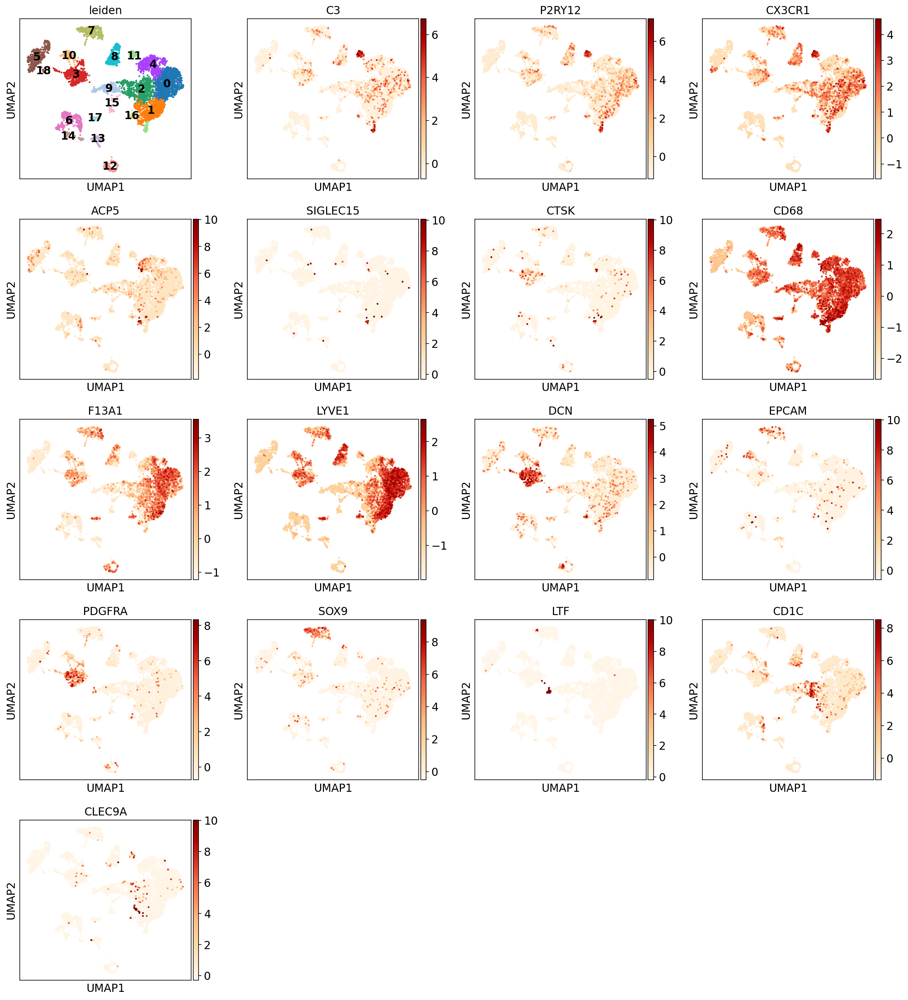

In [45]:
sc.pl.umap(adata, color = ['leiden', 'C3', 'P2RY12', 'CX3CR1', 'ACP5', 
                          'SIGLEC15', 'CTSK', 'CD68', 'F13A1', 'LYVE1', 
                           'DCN', 'EPCAM', 'PDGFRA', 'SOX9', "LTF", 'CD1C', 'CLEC9A'], color_map = 'OrRd', legend_loc = 'on data', use_raw = False)

#### Compute marker genes per cluster with TF-IDF

In [46]:
adata_counts = anndata.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs, asview=False)

In [49]:
# Binarize counts matrix (1 if expressed, 0 otherwise)
import episcanpy as epi
adata_bin = epi.pp.binarize(adata_counts, copy=True)
adata_bin.X.shape
# Compute TF-IDF
from sklearn.feature_extraction.text import TfidfTransformer
transformer = TfidfTransformer()
tfidf = transformer.fit_transform(adata_bin.X.T)
adata_bin.X = tfidf.T
adata_bin.X.shape

(5533, 28820)

In [50]:
#Compute Mann-Withney test with scanpy
sc.tl.rank_genes_groups(adata_bin, groupby='leiden', use_raw=False) #, method='logreg'

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


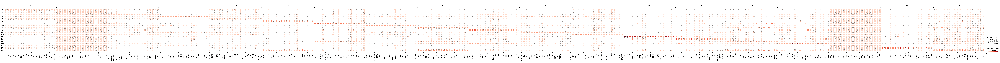

In [51]:
#Plot TF-IDF values
sc.pl.rank_genes_groups_dotplot(adata_bin, n_genes=20, dendrogram=False, save='_rawtfidf_scanpy.pdf')

In [52]:
# Plot with gene expression normalized values
sc.pp.normalize_per_cell(adata_counts, counts_per_cell_after=1e4)
sc.pp.log1p(adata_counts)
sc.pp.scale(adata_counts, max_value=10)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


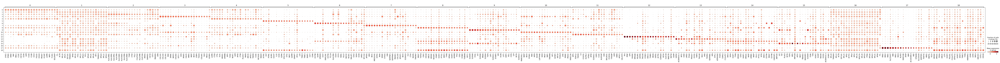

In [53]:
adata_counts.uns['rank_genes_groups'] = adata_bin.uns['rank_genes_groups']
sc.pl.rank_genes_groups_dotplot(adata_counts, n_genes=20, dendrogram=False, save='_tfidf_scanpy.pdf', use_raw = False)

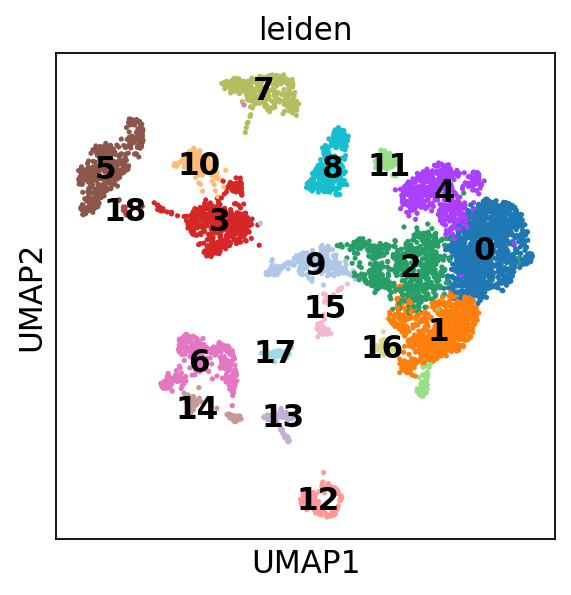

In [54]:
sc.pl.umap(adata, color = ['leiden'], legend_loc = 'on data')

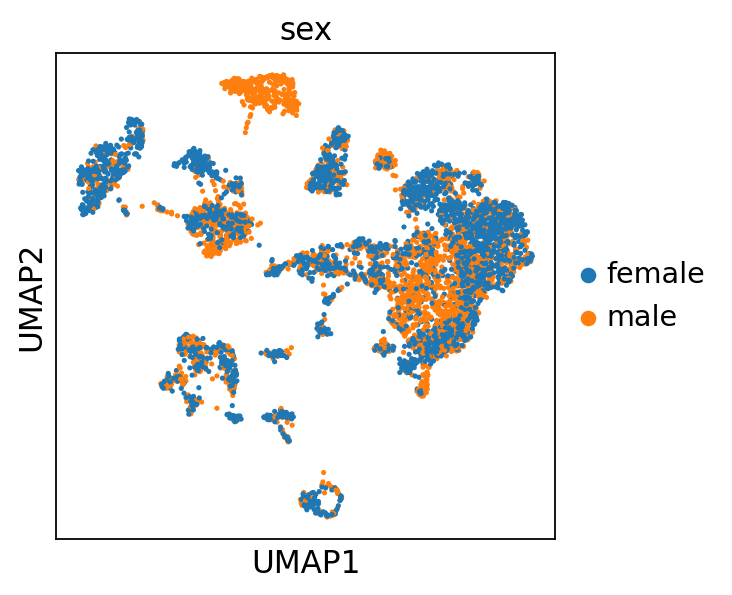

In [55]:
sc.pl.umap(adata, color = ['sex'])

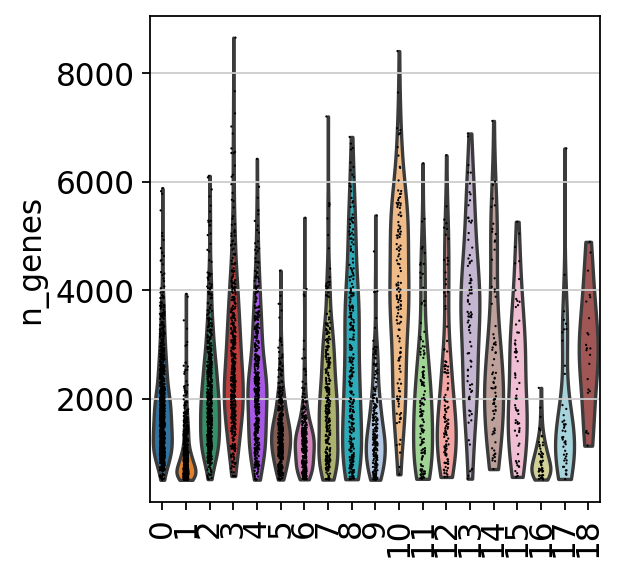

In [56]:
sc.pl.violin(adata, keys = ['n_genes'], groupby = 'leiden', rotation = 90)

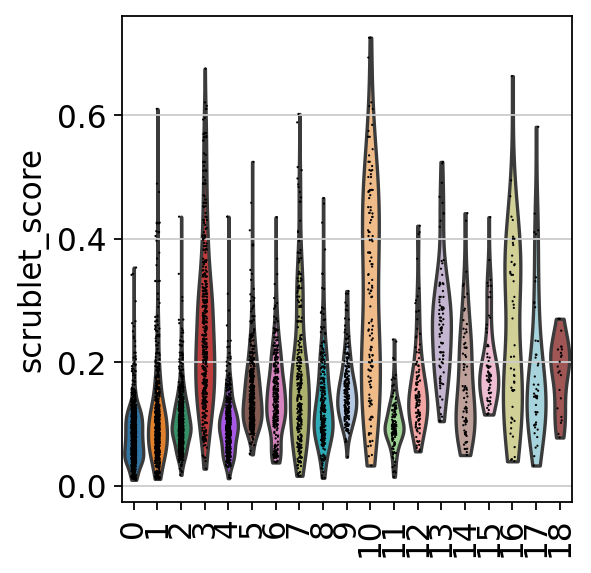

In [57]:
sc.pl.violin(adata, keys = ['scrublet_score'], groupby = 'leiden', rotation = 90)

#### Remove clusters of non-immune cells based on markers

 * clusters 10, 3, 7, 17  are contaminants 
 * cluster 1, 16 has low quality (low number of genes from violin plot) and no markers 

In [58]:
adata = adata[[i not in ['10', '3', '7', '17', '1', '16'] for i in adata.obs['leiden']]]
adata

View of AnnData object with n_obs × n_vars = 3840 × 20487
    obs: 'n_genes', 'sample', 'donor', 'location', 'stage', 'sex', 'study', 'batch_collection', 'enrichment', 'cryopreserved', 'TP', '10xKit', 'dig_protocol', 'percent_mito', 'n_counts', 'batch', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'lineages_v1', 'celltype_v1', 'lineage_v2', 'somatic_celltype_v2', 'PCW', 'sample_source', 'trimester', 'lineage', 'leiden'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'n_cells-15', 'gene_ids-16', 'feature_types-16', 'n_cells-16', 

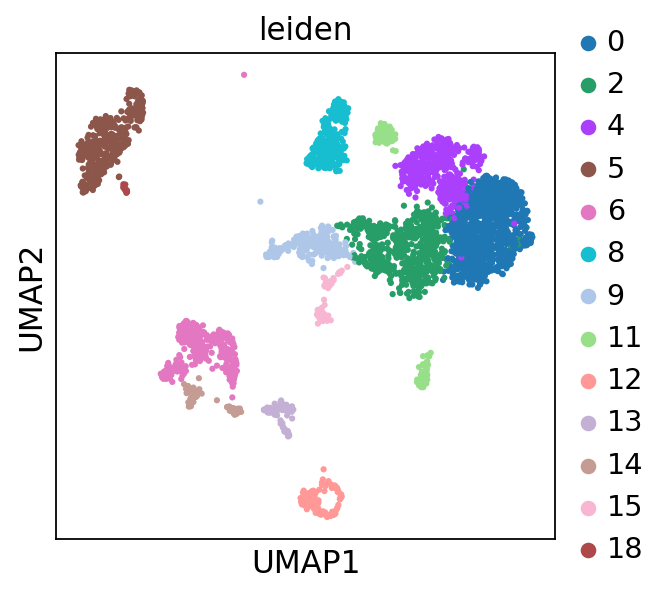

In [59]:
sc.pl.umap(adata, color = 'leiden')

#### Save immune cells from non-enriched samples 

In [60]:
adata.write('/nfs/team292/vl6/immune_fetal_gonads/immune_non_enriched_samples.h5ad')

#### End of notebook